# Part 2 - Data Exploration and Model Selection

## Introdution

- For classification, KNN, Random Forest and MLP models were trained and tested. To evaluate these methods facing unseen data, cross validation method was used.

## Data exploration

What I do:
- Standardizing the data
- Plotting a boxplot of each feature
- Plotting histogram of each feature, using a different color for each class
- Plotting pairplot (each feature against each feature and the label against each feature)
- Fitting PCA using two components
- Plotting the PCA figure with two components, coloring the data points according to their species
- Makeing clear figures, useing titles and legends for clarification

In [2]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import RepeatedKFold, train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn import metrics
import matplotlib.pyplot as plt 
import seaborn as sb
from statistics import mode
import numpy as np

In [3]:
# I am using the output of previous part directly

data_path = '../training_data/rice_feature_data.parquet' # path of data
data = pd.read_parquet(data_path)               # reading parquet file
data.head()                                     # printing a few lines to see if everything is ok

,mean_b,var_b,skew_b,kurt_b,entr_b,mean_g,var_g,skew_g,kurt_g,entr_g,...,kurt_r,entr_r,major_axis_length,minor_axis_length,area,perimeter,roundness,aspect_ratio,class,class_int
0,237.701602,235.550005,-0.916309,0.337702,5.498779,231.293858,301.677048,-0.746753,-0.196393,5.868242,...,-0.155548,5.841225,146.282043,72.265778,8084.5,371.404109,0.736495,2.024223,Arb,0
1,236.918079,157.647628,-0.768407,0.436432,5.485904,232.733608,191.903693,-0.752232,0.325161,5.688247,...,0.349649,5.657413,137.059006,65.893982,6933.5,354.232535,0.694361,2.079993,Arb,0
2,216.536679,259.919503,-0.839951,-0.140669,5.501954,210.975351,283.247363,-0.772167,-0.337009,5.604155,...,-0.316691,5.572969,132.384201,67.964844,6929.5,351.178713,0.706082,1.947834,Arb,0
3,212.078894,167.887738,-0.647664,0.068170,5.637232,207.893328,195.452218,-0.596941,-0.158326,5.740592,...,-0.192698,5.729030,149.286682,71.326492,8045.5,384.232536,0.684817,2.093005,Arb,0
4,233.318557,211.242371,-0.424428,-0.734968,5.665341,221.524494,225.958931,-0.303483,-0.890377,5.749867,...,-0.871835,5.735764,140.248886,71.801796,7663.5,365.060963,0.722614,1.953278,Arb,0


In [4]:
data.dtypes # checking types of featues to decide whether they need to be standardized

mean_b               float64
var_b                float64
skew_b               float64
kurt_b               float64
entr_b               float64
mean_g               float64
var_g                float64
skew_g               float64
kurt_g               float64
entr_g               float64
mean_r               float64
var_r                float64
skew_r               float64
kurt_r               float64
entr_r               float64
major_axis_length    float64
minor_axis_length    float64
area                 float64
perimeter            float64
roundness            float64
aspect_ratio         float64
class                 object
class_int              int64
dtype: object

In [5]:
data.class_int.value_counts() # checking value count of integer class to check whether 
                              # there is negative values

0    100
1    100
2    100
Name: class_int, dtype: int64

In [6]:
# creating the columns for standardazing
columns = data.columns.tolist()
columns.remove('class')
columns.remove('class_int')
columns

['mean_b',
 'var_b',
 'skew_b',
 'kurt_b',
 'entr_b',
 'mean_g',
 'var_g',
 'skew_g',
 'kurt_g',
 'entr_g',
 'mean_r',
 'var_r',
 'skew_r',
 'kurt_r',
 'entr_r',
 'major_axis_length',
 'minor_axis_length',
 'area',
 'perimeter',
 'roundness',
 'aspect_ratio']

In [7]:
# I am using z-score for standarizing. The output of this standarizing is between -3 and +3.
# In z-score standarization, we use mean and standard deviation of the data set with observed sample.
# The score determines how far a sample is from the mean, in scale of -3 to +3.

scale= StandardScaler()                            # creating an instance of standardizer
data[columns] = scale.fit_transform(data[columns]) # applying the transformation 
data.head()                                        # printing the data to check it

,mean_b,var_b,skew_b,kurt_b,entr_b,mean_g,var_g,skew_g,kurt_g,entr_g,...,kurt_r,entr_r,major_axis_length,minor_axis_length,area,perimeter,roundness,aspect_ratio,class,class_int
0,0.702268,1.296104,-0.518657,-0.603753,0.737087,1.381771,1.453728,-0.918784,-0.539606,1.002590,...,-0.548778,0.967070,-0.662878,1.468420,0.858662,-0.382661,1.466364,-1.133834,Arb,0
1,0.637647,0.349329,-0.344452,-0.576530,0.711366,1.527036,0.185969,-0.925793,-0.351919,0.566264,...,-0.335125,0.485281,-0.936849,0.908895,-0.000719,-0.702840,1.079154,-1.080698,Arb,0
2,-1.043300,1.592275,-0.428719,-0.735656,0.743432,-0.668283,1.240886,-0.951299,-0.590208,0.362418,...,-0.616928,0.263944,-1.075714,1.090743,-0.003706,-0.759781,1.186873,-1.206614,Arb,0
3,-1.410954,0.473781,-0.202237,-0.678072,1.013700,-0.979246,0.226950,-0.727107,-0.525907,0.693155,...,-0.564490,0.672997,-0.573624,1.385939,0.829544,-0.143464,0.991443,-1.068301,Arb,0
4,0.340778,1.000685,0.060698,-0.899523,1.069858,0.396082,0.579269,-0.351640,-0.789344,0.715637,...,-0.851704,0.690646,-0.842093,1.427676,0.544327,-0.500935,1.338797,-1.201427,Arb,0


<AxesSubplot: >

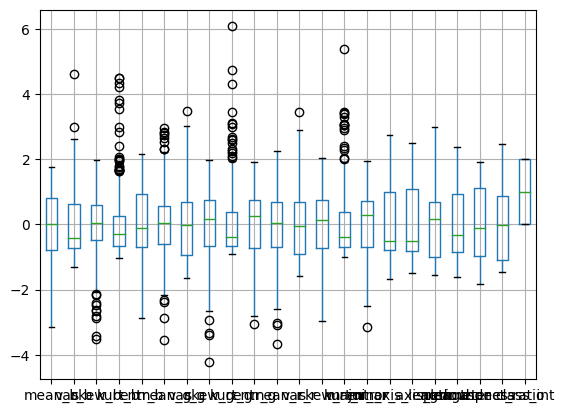

In [8]:
data.boxplot()

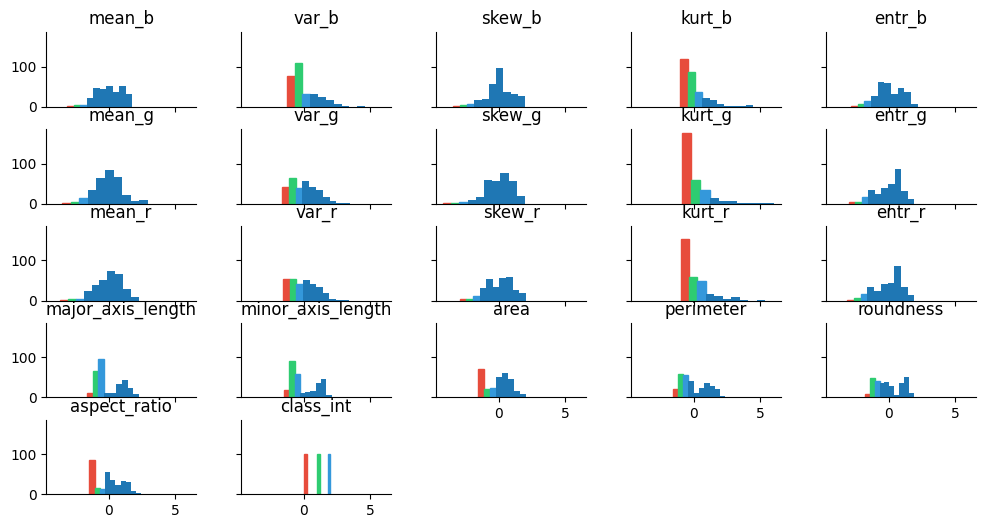

In [9]:
# code reference : 
# https://datascience.stackexchange.com/questions/15043/plotting-different-values-in-pandas-histogram-with-different-colors

# Plot and retrieve the axes
axes = data.hist(figsize=(12,6), sharex=True, sharey=True)

# Define a different color for the first three bars
colors = ["#e74c3c", "#2ecc71", "#3498db"]

for i, ax in enumerate(axes.reshape(-1)):
    # Define a counter to ensure that if we have more than three bars with a value,
    # we don't try to access out-of-range element in colors
    k = 0

    # Optional: remove grid, and top and right spines
    ax.grid(False)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    for rect in ax.patches:
        # If there's a value in the rect and we have defined a color
        if rect.get_height() > 0 and k < len(colors):
            # Set the color
            rect.set_color(colors[k])
            # Increment the counter
            k += 1

plt.show()

In [10]:
sb.pairplot(data, hue='class') # plotting all the features against each other. different classes have
                               # different colors.

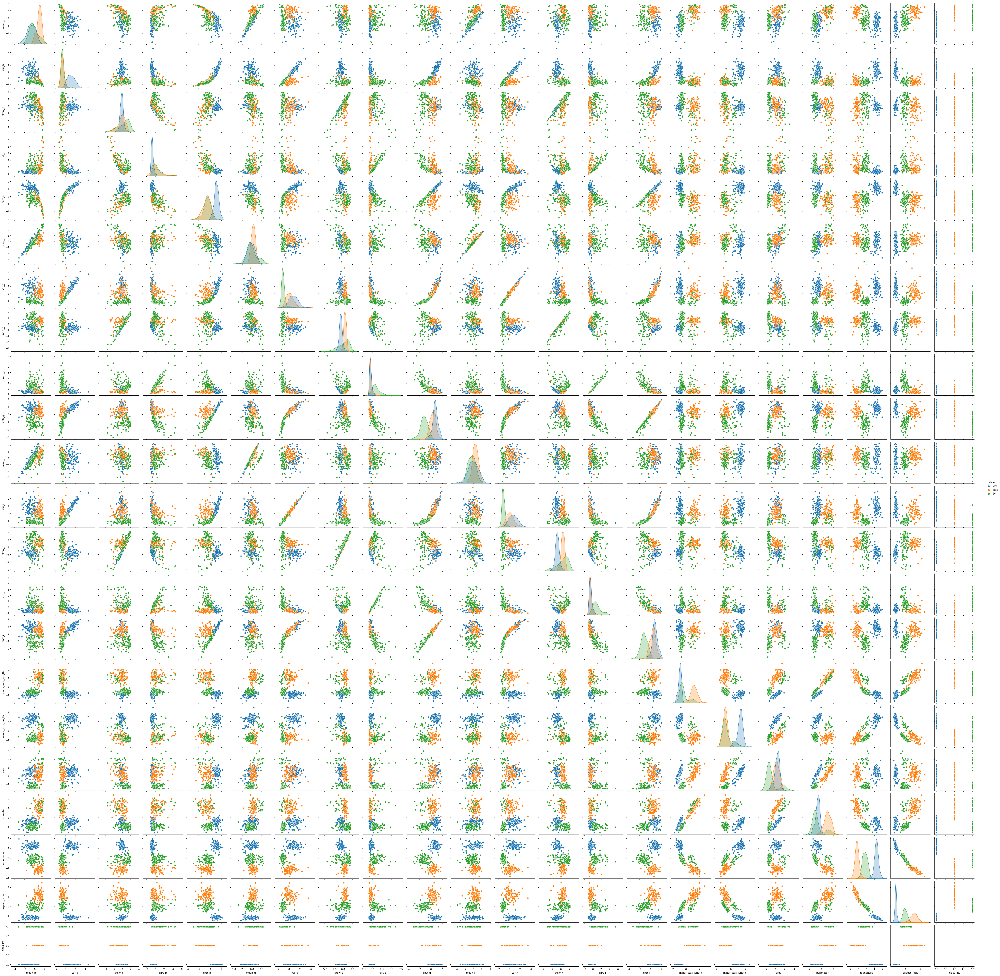

In [11]:
plt.show()

I think roundness and aspect_ratio can be helpful in finding the class. Because the histograms of the classes do not have too much overlap and also in the colored scatter plot colors are totaly divided.

In [12]:
# PCA is a dimention reduction technique for visualization. Data sets usually have many features
# and its difficult to visulize them as human can only see and understand 3 dimentions.
# Also, PCA can be used for making the data less complex to apply other ML algorithms.

pca_2 = PCA(n_components=2) # creating an instance of pca for two components.
pca_2.fit(data[columns])    # fitting the numeral part of the data and creating the transformation
x_pca_2 = pca_2.fit_transform(data[columns]) # applying the transformation

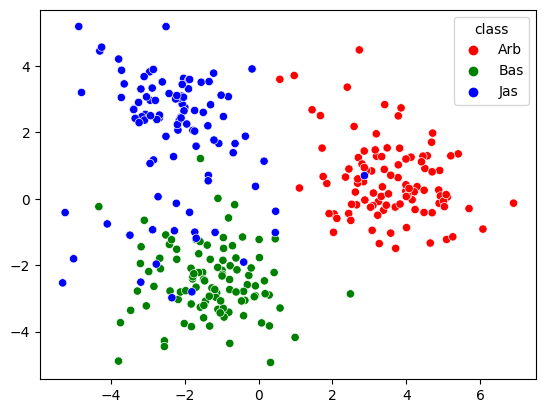

In [13]:
# creating the scatter plot of our pca. different classes are in different colors
sb.scatterplot(x=x_pca_2[:,0], y=x_pca_2[:,1], hue=data['class'], palette=['red', 'green', 'blue'])
plt.show()

There are almost 3 clusters in the picture. Based on pca_2 Arb can be divided from the other two groups by reducing the dimentions to 2.
But Bas and Jas classes have overlap and the data points are not totally seperated.

In [14]:
pca_n = PCA(n_components=0.99) # creating an instance of pca for 99% percentile of the variance.
pca_n.fit(data[columns])    # fitting the numeral part of the data and creating the transformation
x_pca_n = pca_n.fit_transform(data[columns]) # applying the trasformation
print('Number of components: ', pca_n.n_components_) # printing number of components
print('Percentile: ', round(pca_n.explained_variance_ratio_.sum(),5))

Number of components:  10
Percentile:  0.99057


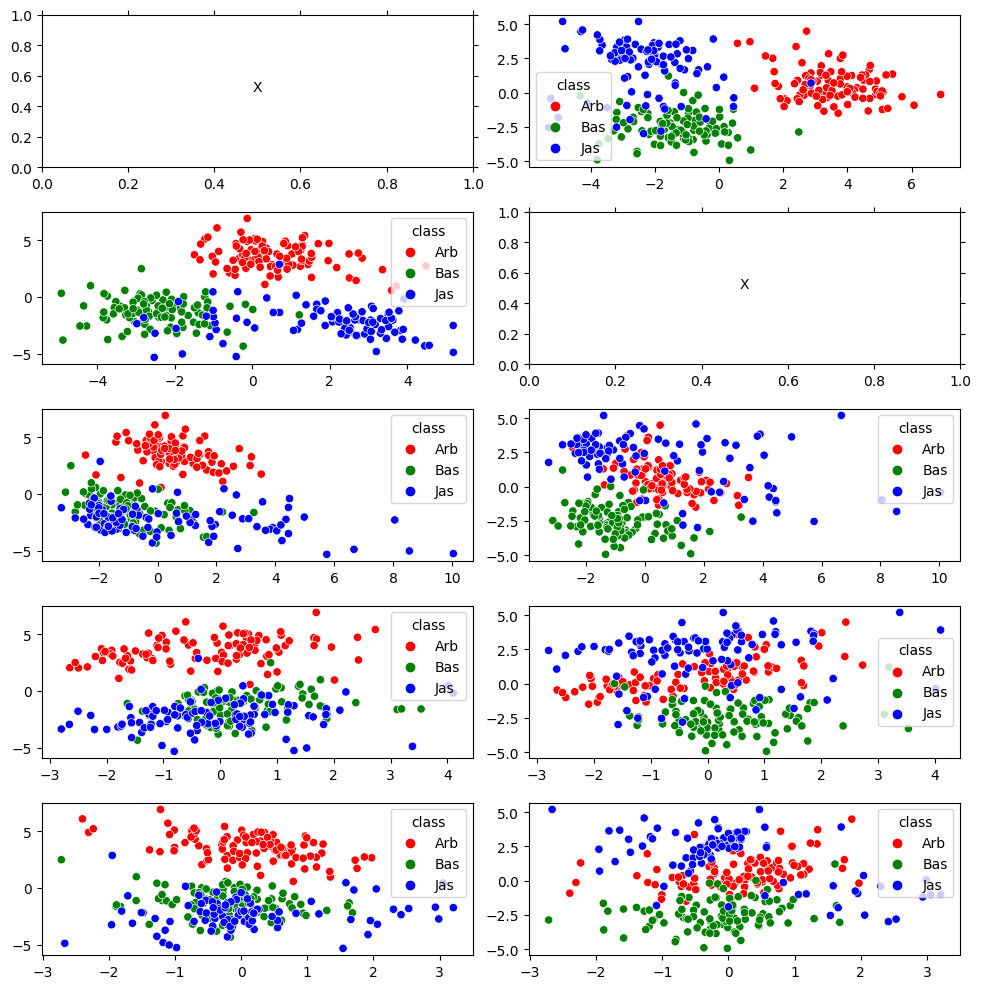

In [15]:
# code reference: 
# https://stackoverflow.com/questions/44105773/how-do-i-show-a-scatter-plot-in-python-after-doing-pca

fig, axes = plt.subplots(5,2, figsize=(10,10))

for row in range(axes.shape[0]):
    for col in range(axes.shape[1]):
        ax = axes[row,col]
        if row == col:
            ax.tick_params(
                axis='both',which='both',
                bottom='off',top='off',
                labelbottom='off',
                left='off',right='off',
                labelleft='off'
            )
            ax.text(0.5,0.5,'X',horizontalalignment='center')
        else:
            sb.scatterplot(x=x_pca_n[:,row], y=x_pca_n[:,col], hue=data['class'],
                           palette=['red', 'green', 'blue'], ax=ax)
fig.tight_layout()
plt.show()

There are 10 PCAs for this dimention reducing. I did not render all of them, but you can see 2 of the PCAs against the others. In a 10 dimentional environment this data can be clustured with 0.99 of the variance in it. But here we only can see 2D cuts (plates) of this environment.

## Model selection 

The best model for each classifier is selected, Using 5-fold repeated cross validation with 3 repetitions (*RepeatedKFold* from sklearn). <br>

- k Nearest Neighbors classifier: hyperparameter k
- random forest: hyperparameters max_depth and max_features
- MLP: use one hidden layer and Early stopping. Hyperparameters:
    - number of neurons in the hidden layer
    - activation function: logistic sigmoid function and rectified linear unit function
    - solver: stochastic gradient descent and adam
    - validation_fraction: 0.1 and 0.5

What I have reported for each classifier:
- The best hyperparameter or the best combination of hyperparameters. <br>
- The accuracy versus the hyperparameter/hyperparameter combination and highlight the best value plots. <br>

For random forest model, the aim is to find feature importance for each feature. 

### KNN

In [16]:
# code reference:
# https://www.tutorialspoint.com/scikit_learn/scikit_learn_kneighbors_classifier.htm

range_k = range(1,11)
rkf = RepeatedKFold(n_splits=5, n_repeats=3) # creating folds and number of repeats.
best_k_list = []
for train_index, test_index in rkf.split(data[columns]):
   X_train = data[columns].iloc[train_index] # creating train data set
   X_test = data[columns].iloc[test_index]   # creating test data set
   y_train = data['class_int'].iloc[train_index] # creating train label set
   y_test = data['class_int'].iloc[test_index]   # creating test label set
   scores_list = []
   for k in range_k:
      classifier = KNeighborsClassifier(n_neighbors=k) # creating the classifier with k neighbours
      classifier.fit(X_train, y_train)                 # creating the model
      y_pred = classifier.predict(X_test)              # predicting by the model
      scores_list.append(metrics.accuracy_score(y_test,y_pred)) # collecting the score of each k
                                                                # to choose the best of them
   best_k_list.append(scores_list.index(max(scores_list)) + 1) # choosing the k with the highest 
                                                               # accuracy from the score list
print('best K: ', mode(best_k_list)) # choosing the k with the most repetition

best K:  1


Based on the result the best k is 1. Now, I check the data with this hyper parameter to see how exactly it is working.

In [17]:
X_train, X_test, y_train, y_test = train_test_split(data[columns], data['class_int'], test_size=0.2)
classifier = KNeighborsClassifier(n_neighbors=1) # best K
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
print(metrics.accuracy_score(y_test,y_pred))
result = metrics.confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(result)
result1 = metrics.classification_report(y_test, y_pred)
print("Classification Report:",)
print (result1)

1.0
Confusion Matrix:
[[22  0  0]
 [ 0 16  0]
 [ 0  0 22]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        22
           1       1.00      1.00      1.00        16
           2       1.00      1.00      1.00        22

    accuracy                           1.00        60
   macro avg       1.00      1.00      1.00        60
weighted avg       1.00      1.00      1.00        60



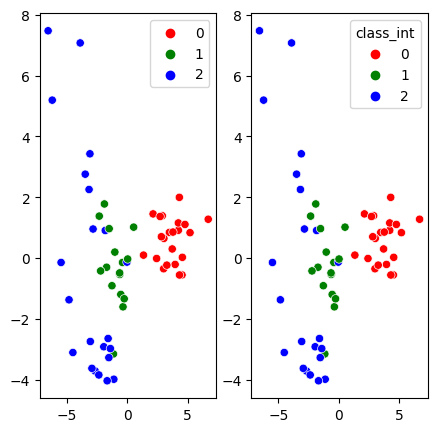

In [18]:
pca_2 = PCA(n_components=2) # creating an instance of pca for two components.
pca_2.fit(X_test)           # fitting the numeral part of the data and creating the transformation
x_pca_2 = pca_2.fit_transform(X_test) # applying the transformation
fig, axes = plt.subplots(1,2, figsize=(5,5))
sb.scatterplot(x=x_pca_2[:,0], y=x_pca_2[:,1], hue=y_pred, palette=['red', 'green', 'blue']
               , ax=axes[0])
sb.scatterplot(x=x_pca_2[:,0], y=x_pca_2[:,1], hue=y_test, palette=['red', 'green', 'blue']
               , ax=axes[1])
plt.show()

It looks like the real classes and the predicted classes are pretty much the same. It's suspecious! I think I did something wrong.

### Random Forest

In [19]:
max_depth = range(2,6) # depth range
max_features = range(1,10) # features range

scores = []  # list of scores
indexis = [] # indexis of the scores

rkf = RepeatedKFold(n_splits=5, n_repeats=3) # creating folds and number of repeats.
for train_index, test_index in rkf.split(data[columns]):
    X_train = data[columns].iloc[train_index] # creating train data set
    X_test = data[columns].iloc[test_index]   # creating test data set
    y_train = data['class_int'].iloc[train_index] # creating train label set
    y_test = data['class_int'].iloc[test_index]   # creating test label set
    for d in max_depth:
        for f in max_features:
            clf = RandomForestClassifier(max_depth=d, max_features=f) # creating random forest model
            clf.fit(X_train, y_train)                                 # fitting the model
            y_pred = clf.predict(X_test)                              # predicting by the model
            score = metrics.accuracy_score(y_test,y_pred)             # calculating the accuracy
            scores.append(score)                                      # saving the score
            indexis.append(str(f)+','+str(d))                         # saving the accuracy

In [20]:
index = scores.index(max(scores)) # figuring out the best parameter
indexis[index]

'8,2'

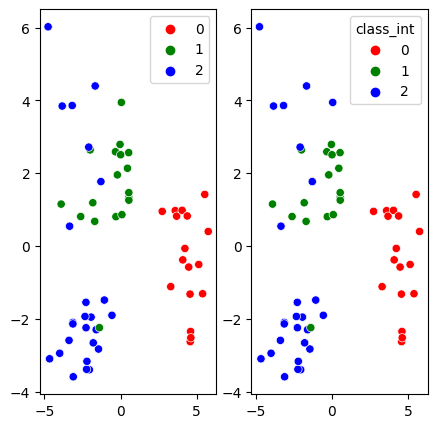

In [31]:
X_train, X_test, y_train, y_test = train_test_split(data[columns], data['class_int'], test_size=0.2)
clf = RandomForestClassifier(max_depth=2, max_features=7)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
pca_2 = PCA(n_components=2) # creating an instance of pca for two components.
pca_2.fit(X_test)           # fitting the numeral part of the data and creating the transformation
x_pca_2 = pca_2.fit_transform(X_test) # applying the transformation
fig, axes = plt.subplots(1,2, figsize=(5,5))
sb.scatterplot(x=x_pca_2[:,0], y=x_pca_2[:,1], hue=y_pred, palette=['red', 'green', 'blue']
               , ax=axes[0])
sb.scatterplot(x=x_pca_2[:,0], y=x_pca_2[:,1], hue=y_test, palette=['red', 'green', 'blue']
               , ax=axes[1])
plt.show()

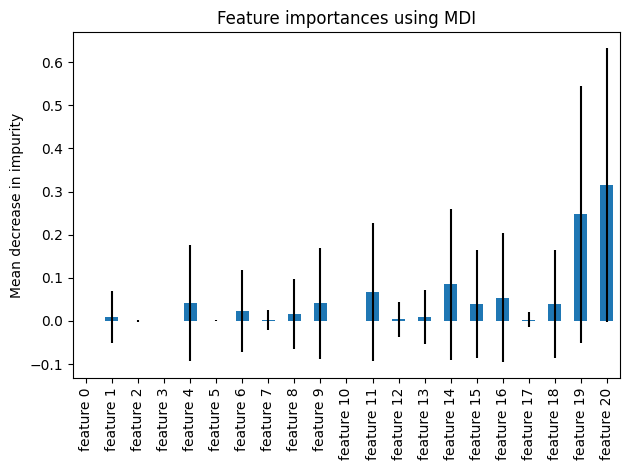

In [35]:
# https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html
feature_names = [f"feature {i}" for i in range(X_train.shape[1])]
importances = clf.feature_importances_
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
std = np.std([tree.feature_importances_ for tree in clf.estimators_], axis=0)
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()
plt.show()

Based on this plot, the last two features are the most important ones. It was the same when I gussed earlier based on the histagram and scatter plots.

### MLP

In this method I select the best model for each classifier, Using 5-fold repeated cross validation with 3 repetitions (*RepeatedKFold* from sklearn).<br>

- k Nearest Neighbors classifier: hyperparameter k
- random forest: hyperparameters max_depth and max_features
- MLP: use one hidden layer and Early stopping. Hyperparameters:
    - number of neurons in the hidden layer
    - activation function: logistic sigmoid function and rectified linear unit function
    - solver: stochastic gradient descent and adam
    - validation_fraction: 0.1 and 0.5

For each classifier:
- The best hyperparameter or the best combination of hyperparameters is reported. <br>
- The accuracy versus the hyperparameter/hyperparameter combination and highlight the best value plots are conducted. <br>

For random forest model, I find the feature importance for each feature. <br>

In [27]:
scores = []  # list of scores
params = [] # parameters of the scores

nn_neurons = [100, 150, 200]
activation_function = ['logistic', 'relu']
solver = ['sgd', 'adam']
validation_fraction = [0.1, 0.5]
for nn in nn_neurons:
    for af in activation_function:
        for s in solver:
            for vf in validation_fraction:  
                rkf = RepeatedKFold(n_splits=5, n_repeats=3) # creating folds and number of repeats.
                for train_index, test_index in rkf.split(data[columns]):
                    X_train = data[columns].iloc[train_index] # creating train data set
                    X_test = data[columns].iloc[test_index]   # creating test data set
                    y_train = data['class_int'].iloc[train_index] # creating train label set
                    y_test = data['class_int'].iloc[test_index]   # creating test label set
                    # creating the MLP model with hyper params
                    clf = MLPClassifier( hidden_layer_sizes = nn, activation = af, solver = s,
                                        early_stopping=True
                                        , validation_fraction = vf).fit(X_train.values, y_train)
                    # appending the score of the model
                    scores.append(clf.score(X_test.values, y_test))
                    # saving the hyper params
                    params.append(str(nn)+','+af+','+s+','+str(vf))

In [28]:
index = scores.index(max(scores)) # figuring out the best parameter
params[index]

'100,logistic,adam,0.5'

/home/maryamt/.local/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


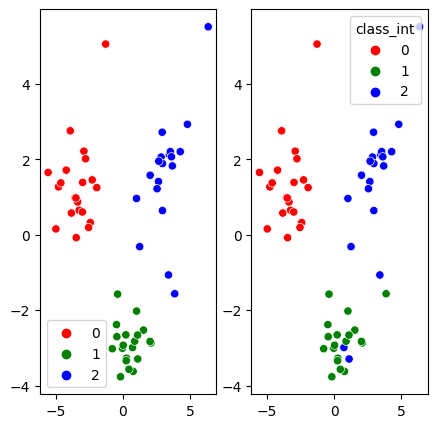

In [30]:
X_train, X_test, y_train, y_test = train_test_split(data[columns], data['class_int'], test_size=0.2)
clf = MLPClassifier( hidden_layer_sizes = 100, activation = 'logistic', solver = 'adam',
                    validation_fraction = 0.5, early_stopping=True).fit(X_train.values, y_train)
y_pred = clf.predict(X_test)
pca_2 = PCA(n_components=2) # creating an instance of pca for two components.
pca_2.fit(X_test)           # fitting the numeral part of the data and creating the transformation
x_pca_2 = pca_2.fit_transform(X_test) # applying the transformation
fig, axes = plt.subplots(1,2, figsize=(5,5))
sb.scatterplot(x=x_pca_2[:,0], y=x_pca_2[:,1], hue=y_pred, palette=['red', 'green', 'blue']
               , ax=axes[0])
sb.scatterplot(x=x_pca_2[:,0], y=x_pca_2[:,1], hue=y_test, palette=['red', 'green', 'blue']
               , ax=axes[1])
plt.show()

It looks like the MLP is performing worse than the other models. But I believe if we add a validation method the result will be different. I have checked this before for knn and the accuracy went from 0.83 to 0.54. 